In [28]:
# import the libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ignore harmless warnings

import warnings
warnings.filterwarnings("ignore")
import pandasql as psql

# display all the columns in the dataset
pd.set_option("display.max_columns",None)

In [29]:
#  read the file

hrdata=pd.read_csv(r"C:\Users\Dlc\Downloads\HR_Data.csv",header=0)

# create a backup file

hrdata2=hrdata.copy()

In [30]:
hrdata.head()

,Emp_ID,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years,Department,salary
0,HP848558,0.38,0.53,2,157,3,0,1,0,sales,low
1,XI670193,0.80,0.86,5,262,6,0,1,0,sales,medium
2,JL543548,0.11,0.88,7,272,4,0,1,0,sales,medium
3,DF138032,0.72,0.87,5,223,5,0,1,0,sales,low
4,KD453613,0.37,0.52,2,159,3,0,1,0,sales,low


In [31]:
hrdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14999 entries, 0 to 14998
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Emp_ID                 14999 non-null  object 
 1   satisfaction_level     14999 non-null  float64
 2   last_evaluation        14999 non-null  float64
 3   number_project         14999 non-null  int64  
 4   average_montly_hours   14999 non-null  int64  
 5   time_spend_company     14999 non-null  int64  
 6   Work_accident          14999 non-null  int64  
 7   left                   14999 non-null  int64  
 8   promotion_last_5years  14999 non-null  int64  
 9   Department             14999 non-null  object 
 10  salary                 14999 non-null  object 
dtypes: float64(2), int64(6), object(3)
memory usage: 1.3+ MB


In [32]:
hrdata.duplicated().any()

False

In [33]:
hrdata.isnull().sum()

Emp_ID                   0
satisfaction_level       0
last_evaluation          0
number_project           0
average_montly_hours     0
time_spend_company       0
Work_accident            0
left                     0
promotion_last_5years    0
Department               0
salary                   0
dtype: int64

In [34]:
hrdata.Department.value_counts()

sales          4140
technical      2720
support        2229
IT             1227
product_mng     902
marketing       858
RandD           787
accounting      767
hr              739
management      630
Name: Department, dtype: int64

In [35]:
hrdata.salary.value_counts()

low       7316
medium    6446
high      1237
Name: salary, dtype: int64

In [36]:
# count the target or dependent variable by '0' & '1' and their proportion
# (>=10):1 the the data is inbalance data

left_count=hrdata.left.value_counts()
print("class 0",left_count[0])
print("class 1",left_count[1])
print("proportion:",round(left_count[0]/left_count[1],2),": 1")
print("Total bank records :",len(hrdata))

class 0 11428
class 1 3571
proportion: 3.2 : 1
Total bank records : 14999


In [37]:
# label encoder  to handle categorical data

#from sklearn.preprocessing import LabelEncoder
#l=LabelEncoder()
#hrdata['salary']=l.fit_transform(hrdata[['salary']])

In [38]:
hrdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14999 entries, 0 to 14998
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Emp_ID                 14999 non-null  object 
 1   satisfaction_level     14999 non-null  float64
 2   last_evaluation        14999 non-null  float64
 3   number_project         14999 non-null  int64  
 4   average_montly_hours   14999 non-null  int64  
 5   time_spend_company     14999 non-null  int64  
 6   Work_accident          14999 non-null  int64  
 7   left                   14999 non-null  int64  
 8   promotion_last_5years  14999 non-null  int64  
 9   Department             14999 non-null  object 
 10  salary                 14999 non-null  object 
dtypes: float64(2), int64(6), object(3)
memory usage: 1.3+ MB


In [39]:
hrdata.Emp_ID.value_counts()

HP848558    1
YL730602    1
GK146336    1
TR603314    1
RR441734    1
           ..
OT436806    1
KD817593    1
UV484111    1
VJ412714    1
ZX589675    1
Name: Emp_ID, Length: 14999, dtype: int64

In [40]:
hrdata.columns

Index(['Emp_ID', 'satisfaction_level', 'last_evaluation', 'number_project',
       'average_montly_hours', 'time_spend_company', 'Work_accident', 'left',
       'promotion_last_5years', 'Department', 'salary'],
      dtype='object')

In [41]:
cols1=["Department","salary"]
cols2=['satisfaction_level', 'last_evaluation', 'number_project',
       'average_montly_hours', 'time_spend_company']

In [42]:
del hrdata["Emp_ID"]

In [43]:
hrdata['Department'].value_counts()

sales          4140
technical      2720
support        2229
IT             1227
product_mng     902
marketing       858
RandD           787
accounting      767
hr              739
management      630
Name: Department, dtype: int64

In [44]:
hrdata=pd.get_dummies(hrdata,columns=cols1)
hrdata.head()

# variable_subvariable by deleting the original variable

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years,Department_IT,Department_RandD,Department_accounting,Department_hr,Department_management,Department_marketing,Department_product_mng,Department_sales,Department_support,Department_technical,salary_high,salary_low,salary_medium
0,0.38,0.53,2,157,3,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0
1,0.80,0.86,5,262,6,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1
2,0.11,0.88,7,272,4,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1
3,0.72,0.87,5,223,5,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0
4,0.37,0.52,2,159,3,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0


In [45]:
hrdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14999 entries, 0 to 14998
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   satisfaction_level      14999 non-null  float64
 1   last_evaluation         14999 non-null  float64
 2   number_project          14999 non-null  int64  
 3   average_montly_hours    14999 non-null  int64  
 4   time_spend_company      14999 non-null  int64  
 5   Work_accident           14999 non-null  int64  
 6   left                    14999 non-null  int64  
 7   promotion_last_5years   14999 non-null  int64  
 8   Department_IT           14999 non-null  uint8  
 9   Department_RandD        14999 non-null  uint8  
 10  Department_accounting   14999 non-null  uint8  
 11  Department_hr           14999 non-null  uint8  
 12  Department_management   14999 non-null  uint8  
 13  Department_marketing    14999 non-null  uint8  
 14  Department_product_mng  14999 non-null

In [46]:
# identifying independent and target variable

IndepVar=[]
for col in hrdata.columns:
    if col != 'left':
        IndepVar.append(col)
TarVar='left'
x=hrdata[IndepVar]
y=hrdata[TarVar]

In [47]:
# Split the data into train and test (random sampling)

from sklearn.model_selection import train_test_split 

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=0)

# Display the shape for train & test data

x_train.shape,x_test.shape,y_train.shape,y_test.shape

((10499, 20), (4500, 20), (10499,), (4500,))

In [48]:
from sklearn.preprocessing import MinMaxScaler
mmscaler=MinMaxScaler(feature_range=(0 , 1))

# fit_transform(). It will calculate the mean(μ)and standard deviation(σ) of the feature
#F at a time it will transform the data points of the feature F.
x_train[cols2]=mmscaler.fit_transform(x_train[cols2])
#x_train=mmscaler.fit_transform(x_train)
x_train=pd.DataFrame(x_train)

x_test[cols2]=mmscaler.fit_transform(x_test[cols2])
#x_test=mmscaler.fit_transform(x_test)
x_test=pd.DataFrame(x_test)

In [49]:
hrdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14999 entries, 0 to 14998
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   satisfaction_level      14999 non-null  float64
 1   last_evaluation         14999 non-null  float64
 2   number_project          14999 non-null  int64  
 3   average_montly_hours    14999 non-null  int64  
 4   time_spend_company      14999 non-null  int64  
 5   Work_accident           14999 non-null  int64  
 6   left                    14999 non-null  int64  
 7   promotion_last_5years   14999 non-null  int64  
 8   Department_IT           14999 non-null  uint8  
 9   Department_RandD        14999 non-null  uint8  
 10  Department_accounting   14999 non-null  uint8  
 11  Department_hr           14999 non-null  uint8  
 12  Department_management   14999 non-null  uint8  
 13  Department_marketing    14999 non-null  uint8  
 14  Department_product_mng  14999 non-null

Confusion matrix : 
 [[ 998   40]
 [  20 3442]]
Outcome values : 
 998 40 20 3442
Classification report : 
               precision    recall  f1-score   support

           1       0.98      0.96      0.97      1038
           0       0.99      0.99      0.99      3462

    accuracy                           0.99      4500
   macro avg       0.98      0.98      0.98      4500
weighted avg       0.99      0.99      0.99      4500

Accuracy : 98.7 %
Precision : 98.0 %
Recall : 96.1 %
F1 Score : 0.971
Specificity or True Negative Rate : 99.4 %
Balanced Accuracy : 97.8 %
MCC : 0.962
roc_auc_score: 0.978


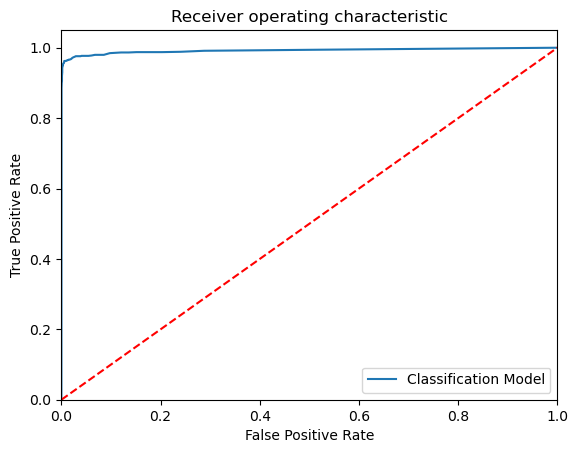

-----------------------------------------------------------------------------------------------------


In [50]:
# To build the 'Random Forest' model with random sampling

from sklearn.ensemble import ExtraTreesClassifier

# Create an object for Extra Trees Classifier 

ModelET = ExtraTreesClassifier()

# Train the model with train data 

ModelET.fit(x_train,y_train)

# Predict the model with test data set

y_pred = ModelET.predict(x_test)
y_pred_prob = ModelET.predict_proba(x_test)

# Confusion matrix in sklearn

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# actual values

actual = y_test

# predicted values

predicted = y_pred

# confusion matrix

matrix = confusion_matrix(actual, predicted, labels=[1,0],sample_weight=None, normalize=None)
print('Confusion matrix : \n', matrix)

# outcome values order in sklearn

tp, fn, fp, tn = confusion_matrix(actual, predicted, labels=[1,0]).reshape(-1)
print('Outcome values : \n', tp, fn, fp, tn)

# classification report for precision, recall f1-score and accuracy

C_Report = classification_report(actual, predicted, labels=[1,0])

print('Classification report : \n', C_Report)

# calculating the metrics

sensitivity = round(tp/(tp+fn), 3);
specificity = round(tn/(tn+fp), 3);
accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
balanced_accuracy = round((sensitivity+specificity)/2, 3);
precision = round(tp/(tp+fp), 3);
f1Score = round((2*tp/(2*tp + fp + fn)), 3);

# Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
# A model with a score of +1 is a perfect model and -1 is a poor model

from math import sqrt

mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

print('Accuracy :', round(accuracy*100, 2),'%')
print('Precision :', round(precision*100, 2),'%')
print('Recall :', round(sensitivity*100,2), '%')
print('F1 Score :', f1Score)
print('Specificity or True Negative Rate :', round(specificity*100,2), '%'  )
print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
print('MCC :', MCC)

# Area under ROC curve 

from sklearn.metrics import roc_curve, roc_auc_score

print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))

# ROC Curve

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
model_roc_auc = roc_auc_score(actual, predicted)
fpr, tpr, thresholds = roc_curve(actual, ModelET.predict_proba(x_test)[:,1])
plt.figure()
#--------------------------------------------------------------------
plt.plot(fpr, tpr, label= 'Classification Model' % model_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show() 
print('-----------------------------------------------------------------------------------------------------')

In [51]:
hrdata.columns

Index(['satisfaction_level', 'last_evaluation', 'number_project',
       'average_montly_hours', 'time_spend_company', 'Work_accident', 'left',
       'promotion_last_5years', 'Department_IT', 'Department_RandD',
       'Department_accounting', 'Department_hr', 'Department_management',
       'Department_marketing', 'Department_product_mng', 'Department_sales',
       'Department_support', 'Department_technical', 'salary_high',
       'salary_low', 'salary_medium'],
      dtype='object')

In [52]:
hrdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14999 entries, 0 to 14998
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   satisfaction_level      14999 non-null  float64
 1   last_evaluation         14999 non-null  float64
 2   number_project          14999 non-null  int64  
 3   average_montly_hours    14999 non-null  int64  
 4   time_spend_company      14999 non-null  int64  
 5   Work_accident           14999 non-null  int64  
 6   left                    14999 non-null  int64  
 7   promotion_last_5years   14999 non-null  int64  
 8   Department_IT           14999 non-null  uint8  
 9   Department_RandD        14999 non-null  uint8  
 10  Department_accounting   14999 non-null  uint8  
 11  Department_hr           14999 non-null  uint8  
 12  Department_management   14999 non-null  uint8  
 13  Department_marketing    14999 non-null  uint8  
 14  Department_product_mng  14999 non-null

In [53]:
# Create a list for plotting the decision trees

figcols = ['satisfaction_level', 'last_evaluation', 'number_project', 'average_montly_hours', 'time_spend_company',
           'Work_accident', 'promotion_last_5years', 'Department_IT', 'Department_RandD', 'Department_accounting',
           'Department_hr', 'Department_management', 'Department_marketing', 'Department_product_mng', 'Department_sales',
           'Department_support', 'Department_technical', 'salary_high', 'salary_low', 'salary_medium']

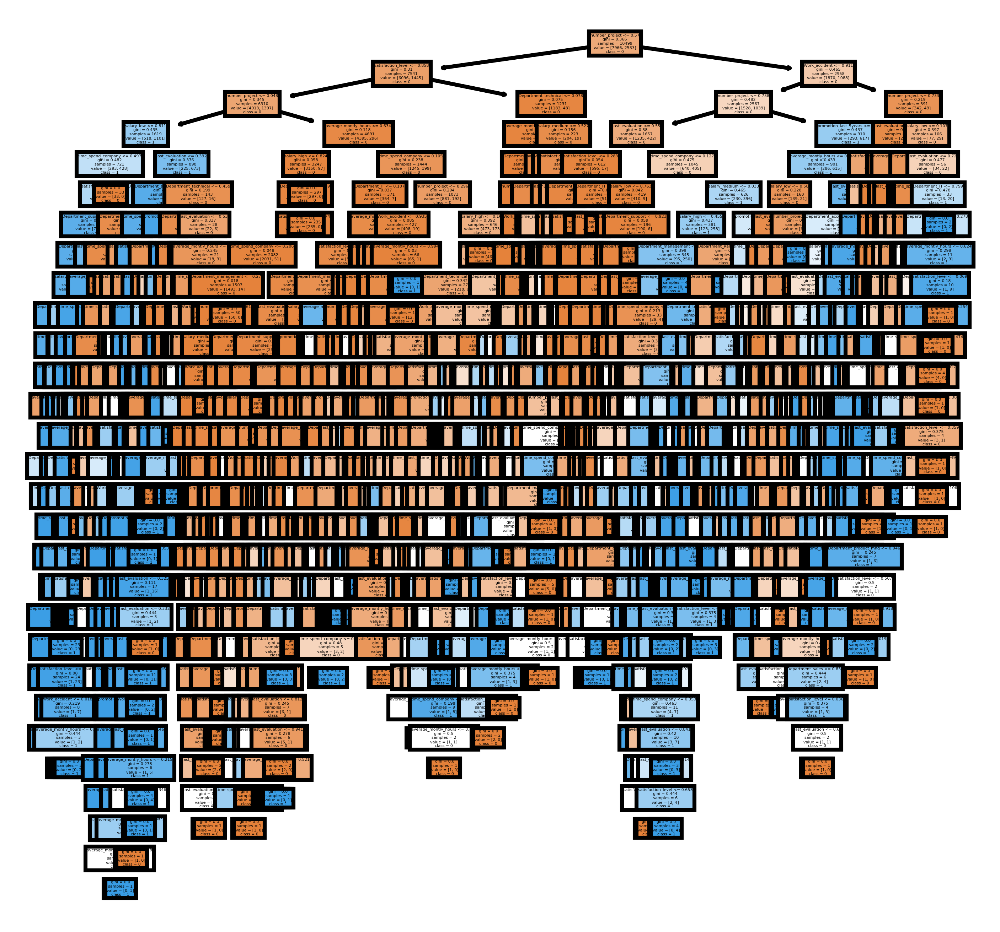

In [54]:
# Visualize individual trees and code below visualizes the first decision tree of Extra Trees Classifier

from sklearn import tree

fn1=figcols
cn1=['0', '1']

fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = (4,4), dpi=800)
tree.plot_tree(ModelET.estimators_[0],
               feature_names = fn1, 
               class_names=cn1,
               filled = True);
#fig.savefig('ModelET.png')

In [55]:
# Visualize individual trees and code below visualizes the first 5 decision trees of Extra Trees Classifier

from sklearn import tree

fn2=figcols
cn2=['0', '1']

fig, axes = plt.subplots(nrows = 1, ncols = 5, figsize = (10,2), dpi=3000)
for index in range(0, 5):
    tree.plot_tree(ModelET.estimators_[index],
                   feature_names = fn2, 
                   class_names=cn2,
                   filled = True,
                   ax = axes[index]);
    
    axes[index].set_title('Estimator: ' + str(index), fontsize = 11)
#fig.savefig('ModelET1.png')

# compare the classification algorithms

In [64]:
# load the result dataset

EMResults=pd.read_csv(r"C:\Users\Dlc\Downloads\EMResults (1).csv",header=0)

# display first fve records

EMResults

,Model Name,True_Positive,False_Negative,False_Positive,True_Negative,Accuracy,Precision,Recall,F1 Score,Specificity,MCC,ROC_AUC_Score,Balanced Accuracy


Model Name:  LogisticRegression()
Confusion matrix : 
 [[ 359  679]
 [ 255 3207]]
Outcome values : 
 359 679 255 3207
Classification report : 
               precision    recall  f1-score   support

           1       0.58      0.35      0.43      1038
           0       0.83      0.93      0.87      3462

    accuracy                           0.79      4500
   macro avg       0.70      0.64      0.65      4500
weighted avg       0.77      0.79      0.77      4500

Accuracy : 79.2 %
Precision : 58.5 %
Recall : 34.6 %
F1 Score : 0.435
Specificity or True Negative Rate : 92.6 %
Balanced Accuracy : 63.6 %
MCC : 0.334
roc_auc_score: 0.636


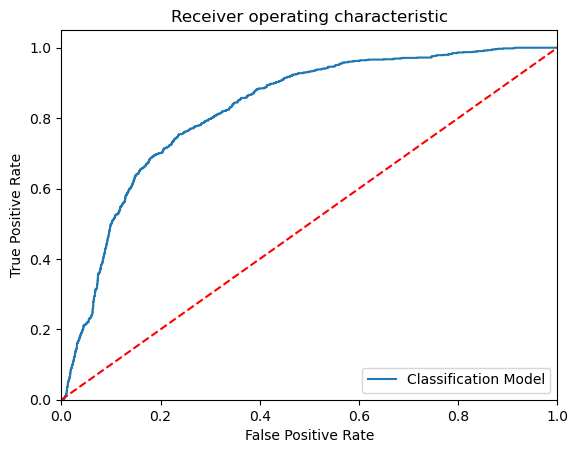

-----------------------------------------------------------------------------------------------------
Model Name:  DecisionTreeClassifier()
Confusion matrix : 
 [[1007   31]
 [  64 3398]]
Outcome values : 
 1007 31 64 3398
Classification report : 
               precision    recall  f1-score   support

           1       0.94      0.97      0.95      1038
           0       0.99      0.98      0.99      3462

    accuracy                           0.98      4500
   macro avg       0.97      0.98      0.97      4500
weighted avg       0.98      0.98      0.98      4500

Accuracy : 97.9 %
Precision : 94.0 %
Recall : 97.0 %
F1 Score : 0.955
Specificity or True Negative Rate : 98.2 %
Balanced Accuracy : 97.6 %
MCC : 0.941
roc_auc_score: 0.976


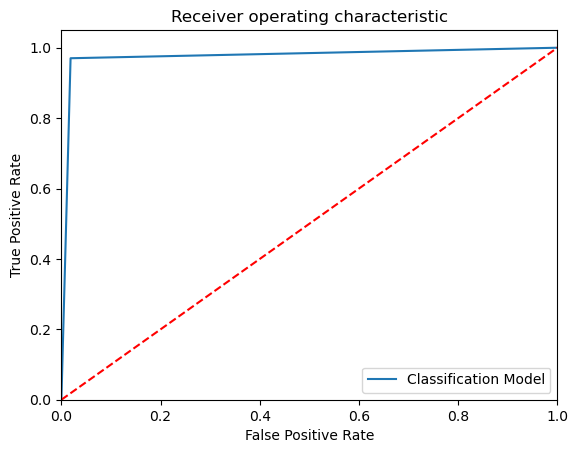

-----------------------------------------------------------------------------------------------------
Model Name:  RandomForestClassifier()
Confusion matrix : 
 [[1000   38]
 [  14 3448]]
Outcome values : 
 1000 38 14 3448
Classification report : 
               precision    recall  f1-score   support

           1       0.99      0.96      0.97      1038
           0       0.99      1.00      0.99      3462

    accuracy                           0.99      4500
   macro avg       0.99      0.98      0.98      4500
weighted avg       0.99      0.99      0.99      4500

Accuracy : 98.8 %
Precision : 98.6 %
Recall : 96.3 %
F1 Score : 0.975
Specificity or True Negative Rate : 99.6 %
Balanced Accuracy : 98.0 %
MCC : 0.967
roc_auc_score: 0.98


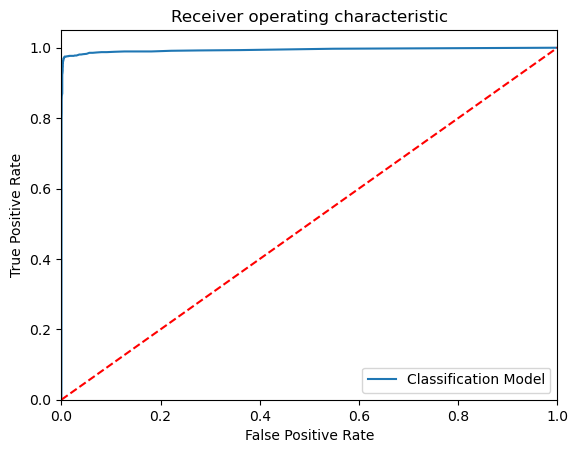

-----------------------------------------------------------------------------------------------------
Model Name:  ExtraTreesClassifier()
Confusion matrix : 
 [[ 999   39]
 [  22 3440]]
Outcome values : 
 999 39 22 3440
Classification report : 
               precision    recall  f1-score   support

           1       0.98      0.96      0.97      1038
           0       0.99      0.99      0.99      3462

    accuracy                           0.99      4500
   macro avg       0.98      0.98      0.98      4500
weighted avg       0.99      0.99      0.99      4500

Accuracy : 98.6 %
Precision : 97.8 %
Recall : 96.2 %
F1 Score : 0.97
Specificity or True Negative Rate : 99.4 %
Balanced Accuracy : 97.8 %
MCC : 0.962
roc_auc_score: 0.978


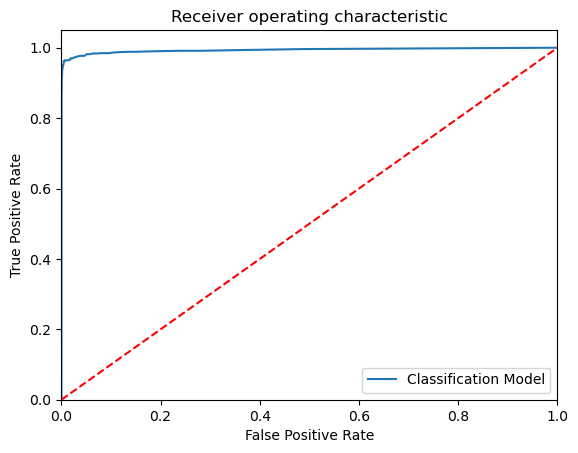

-----------------------------------------------------------------------------------------------------


In [65]:
#==Step_02=============================================================================================================>

# Build the Calssification models and compare the results

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
#from sklearn.neighbors import KNeighborsClassifier
#from sklearn.naive_bayes import GaussianNB
#from sklearn.svm import SVC

# Create objects of classification algorithms with default hyper-parameters

ModelLR = LogisticRegression()
ModelDC = DecisionTreeClassifier()
ModelRF = RandomForestClassifier()
ModelET = ExtraTreesClassifier()
#ModelKNN = KNeighborsClassifier(n_neighbors=5)
#ModelGNB = GaussianNB()
#ModelSVM = SVC(probability=True)

# Evalution matrix for all the algorithms

#MM = [ModelLR, ModelDC, ModelRF, ModelET, ModelKNN, ModelGNB, ModelSVM]
MM = [ModelLR, ModelDC, ModelRF, ModelET]
for models in MM:
            
    # Train the model training dataset
    
    models.fit(x_train, y_train)
    
    # Prediction the model with test dataset
    
    y_pred = models.predict(x_test)
    y_pred_prob = models.predict_proba(x_test)
    
    # Print the model name
    
    print('Model Name: ', models)
    
    # confusion matrix in sklearn

    from sklearn.metrics import confusion_matrix
    from sklearn.metrics import classification_report

    # actual values

    actual = y_test

    # predicted values

    predicted = y_pred

    # confusion matrix

    matrix = confusion_matrix(actual,predicted, labels=[1,0],sample_weight=None, normalize=None)
    print('Confusion matrix : \n', matrix)

    # outcome values order in sklearn

    tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
    print('Outcome values : \n', tp, fn, fp, tn)

    # classification report for precision, recall f1-score and accuracy

    C_Report = classification_report(actual,predicted,labels=[1,0])

    print('Classification report : \n', C_Report)

    # calculating the metrics

    sensitivity = round(tp/(tp+fn), 3);
    specificity = round(tn/(tn+fp), 3);
    accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
    balanced_accuracy = round((sensitivity+specificity)/2, 3);
    
    precision = round(tp/(tp+fp), 3);
    f1Score = round((2*tp/(2*tp + fp + fn)), 3);

    # Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
    # A model with a score of +1 is a perfect model and -1 is a poor model

    from math import sqrt

    mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
    MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

    print('Accuracy :', round(accuracy*100, 2),'%')
    print('Precision :', round(precision*100, 2),'%')
    print('Recall :', round(sensitivity*100,2), '%')
    print('F1 Score :', f1Score)
    print('Specificity or True Negative Rate :', round(specificity*100,2), '%'  )
    print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
    print('MCC :', MCC)

    # Area under ROC curve 

    from sklearn.metrics import roc_curve, roc_auc_score

    print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))
    
    # ROC Curve
    
    from sklearn.metrics import roc_auc_score
    from sklearn.metrics import roc_curve
    Model_roc_auc = roc_auc_score(actual, predicted)
    fpr, tpr, thresholds = roc_curve(actual, models.predict_proba(x_test)[:,1])
    plt.figure()
    #
    plt.plot(fpr, tpr, label= 'Classification Model' % Model_roc_auc)
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc="lower right")
    plt.savefig('Log_ROC')
    plt.show()
    print('-----------------------------------------------------------------------------------------------------')
    #----------------------------------------------------------------------------------------------------------
    new_row = {'Model Name' : models,
               'True_Positive': tp,
               'False_Negative': fn, 
               'False_Positive': fp, 
               'True_Negative': tn,
               'Accuracy' : accuracy,
               'Precision' : precision,
               'Recall' : sensitivity,
               'F1 Score' : f1Score,
               'Specificity' : specificity,
               'MCC':MCC,
               'ROC_AUC_Score':roc_auc_score(actual, predicted),
               'Balanced Accuracy':balanced_accuracy}
    EMResults = EMResults.append(new_row, ignore_index=True)
    #----------------------------------------------------------------------------------------------------------
#======================================================================================================================>



In [66]:
# results with comparing 

EMResults.head(10)

,Model Name,True_Positive,False_Negative,False_Positive,True_Negative,Accuracy,Precision,Recall,F1 Score,Specificity,MCC,ROC_AUC_Score,Balanced Accuracy
0,LogisticRegression(),359,679,255,3207,0.792,0.585,0.346,0.435,0.926,0.334,0.636100,0.636
1,DecisionTreeClassifier(),1007,31,64,3398,0.979,0.940,0.970,0.955,0.982,0.941,0.975824,0.976
2,"(DecisionTreeClassifier(max_features='sqrt', r...",1000,38,14,3448,0.988,0.986,0.963,0.975,0.996,0.967,0.979674,0.980
3,"(ExtraTreeClassifier(random_state=523417988), ...",999,39,22,3440,0.986,0.978,0.962,0.970,0.994,0.962,0.978037,0.978


In [67]:
# prediction the model with the test dataset

y_pred1=ModelRF.predict(x_test)

In [68]:
Results = pd.DataFrame({'left_A':y_test, 'left_P':y_pred})

# Merge two Dataframes on index of both the dataframes

ResultsFinal = hrdata.merge(Results, left_index=True, right_index=True)

# Display 5 records randomly

ResultsFinal.sample(5)

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years,Department_IT,Department_RandD,Department_accounting,Department_hr,Department_management,Department_marketing,Department_product_mng,Department_sales,Department_support,Department_technical,salary_high,salary_low,salary_medium,left_A,left_P
5879,0.74,0.56,3,203,3,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0
6418,0.98,0.70,3,255,2,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0
2280,0.65,0.68,4,128,5,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0
6434,0.60,0.97,3,187,3,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0
13991,0.82,0.67,4,156,3,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0
